# Проекции и кластеры

t-SNE и UMAP по обоим датасетам, кластеризация KMeans и HDBSCAN, выводы по каждому набору данных
и общий итог.

У каждого датасета, кроме класса, есть второй фактор влияющий на разделимость: в RQ1 это
**источник** пары, в WildGuardMix — **стиль** промпта (vanilla / adversarial).

In [ ]:
%pip install -q umap-learn gliner2

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.0/52.0 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 326.2/326.2 kB 17.3 MB/s eta 0:00:00


In [ ]:
import gc
import os
import random
from collections.abc import Sequence
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import polars as pl
import torch
import torch.nn.functional as F
from huggingface_hub import hf_hub_download
from sklearn.cluster import HDBSCAN, KMeans
from sklearn.manifold import TSNE
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score
from transformers import AutoModel, AutoModelForSequenceClassification, AutoTokenizer
from transformers.utils import logging as transformers_logging
from umap import UMAP


SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

MAX_PROMPT_CHARS = 15_000
SAMPLE_PER_CELL = 400
CACHE_PATH = "embeddings_projections.pt"
SOURCE_NAMES = ("SafeSteer", "FORTRESS", "JBB")
STYLE_NAMES = ("vanilla", "adversarial")

if torch.backends.mps.is_available():
    DEVICE = torch.device("mps")
elif torch.cuda.is_available():
    DEVICE = torch.device("cuda")
else:
    DEVICE = torch.device("cpu")

transformers_logging.set_verbosity_error()
print(DEVICE)

cuda


## Модели

Все модели сводятся к вектору через masked mean pooling по последнему слою
энкодера. Это важно именно для сравнения: разный пулинг даёт несопоставимые геометрии.
Поэтому у Prompt-Guard берётся выход бэкбона DeBERTa, а не `ContextPooler` классификационной
головы, а у GLiNER2 — `.encoder`, без задачных голов.

In [ ]:
class MeanPoolingEmbedder:
    """Masked mean pooling по последнему слою энкодера. Возвращает матрицу (d, n)."""

    model_name: str

    def __init__(self, batch_size: int = 8) -> None:
        self.batch_size = batch_size
        self.model, self.tokenizer = self._load()
        self.model = self.model.to(DEVICE).eval()

    def _load(self):
        return (
            AutoModel.from_pretrained(self.model_name),
            AutoTokenizer.from_pretrained(self.model_name),
        )

    def _hidden_state(self, batch: dict[str, torch.Tensor]) -> torch.Tensor:
        return self.model(**batch).last_hidden_state

    def _prepare_texts(self, texts: list[str]) -> list[str]:
        return texts

    def embed(self, texts) -> torch.Tensor:
        texts = self._prepare_texts(list(texts))
        vectors = []

        with torch.inference_mode():
            for start in range(0, len(texts), self.batch_size):
                batch = self.tokenizer(
                    texts[start:start + self.batch_size],
                    padding="longest",
                    truncation=True,
                    return_tensors="pt",
                )
                batch = {name: tensor.to(DEVICE) for name, tensor in batch.items()}
                hidden_state = self._hidden_state(batch)
                mask = batch["attention_mask"].unsqueeze(-1).to(hidden_state.dtype)
                vectors.append(
                    ((hidden_state * mask).sum(dim=1) / mask.sum(dim=1).clamp_min(1.0)).cpu()
                )

        return torch.cat(vectors, dim=0).T.contiguous()

    def __call__(self, texts) -> torch.Tensor:
        return self.embed(texts)


class EttinEncoder68M(MeanPoolingEmbedder):
    model_name = "jhu-clsp/ettin-encoder-68m"


class MmBertSmall(MeanPoolingEmbedder):
    model_name = "jhu-clsp/mmBERT-small"


class E5SmallV2(MeanPoolingEmbedder):
    model_name = "intfloat/e5-small-v2"

    def _prepare_texts(self, texts: list[str]) -> list[str]:
        return [f"query: {text}" for text in texts]


class PromptGuard2_86M(MeanPoolingEmbedder):
    """Prompt Guard 2 — mDeBERTa с бинарной головой; берётся представление бэкбона."""

    model_name = "meta-llama/Llama-Prompt-Guard-2-86M"

    def _load(self):
        return (
            AutoModelForSequenceClassification.from_pretrained(self.model_name),
            AutoTokenizer.from_pretrained(self.model_name),
        )

    def _hidden_state(self, batch: dict[str, torch.Tensor]) -> torch.Tensor:
        return self.model.deberta(**batch).last_hidden_state


class GlinerGuardUniEncoder(MeanPoolingEmbedder):
    """GLiNER2 — nn.Module: бэкбон в .encoder, токенизатор в .processor.tokenizer."""

    model_name = "hivetrace/gliner-guard-uniencoder"

    def _load(self):
        from gliner2 import GLiNER2

        model = GLiNER2.from_pretrained(self.model_name)
        return model, model.processor.tokenizer

    def _hidden_state(self, batch: dict[str, torch.Tensor]) -> torch.Tensor:
        return self.model.encoder(**batch).last_hidden_state


EMBEDDER_TYPES = {
    "ettin-encoder-68m": EttinEncoder68M,
    "mmBERT-small": MmBertSmall,
    "e5-small-v2": E5SmallV2,
    "Prompt-Guard-2-86M": PromptGuard2_86M,
    "gliner-guard-uniencoder": GlinerGuardUniEncoder,
}

## Смешанный датасет

In [ ]:
def read_hf(repo: str, filename: str) -> pl.DataFrame:
    path = hf_hub_download(repo_id=repo, filename=filename, repo_type="dataset")
    return pl.read_csv(path) if filename.endswith(".csv") else pl.read_parquet(path)


jbb_harmful = read_hf("JailbreakBench/JBB-Behaviors", "data/harmful-behaviors.csv")
jbb_benign = read_hf("JailbreakBench/JBB-Behaviors", "data/benign-behaviors.csv")
fortress = read_hf("ScaleAI/fortress_public", "data/train-00000-of-00001.parquet")
safesteer = pl.concat([
    read_hf("NASK-PIB/SafeSteerDataset", f"{split}.parquet")
    for split in ("test", "train")
])

safesteer_pairs = safesteer.select(
    pl.col("unsafe_prompt").alias("harmful_prompt"),
    pl.col("safe_prompt").alias("benign_prompt"),
).with_columns(pl.lit("SafeSteer").alias("source"))

fortress_pairs = fortress.select(
    pl.col("adversarial_prompt").alias("harmful_prompt"),
    pl.col("benign_prompt"),
).with_columns(pl.lit("FORTRESS").alias("source"))

jbb_pairs = (
    jbb_harmful
    .select("Index", pl.col("Goal").alias("harmful_prompt"))
    .join(
        jbb_benign.select("Index", pl.col("Goal").alias("benign_prompt")),
        on="Index",
        how="inner",
        validate="1:1",
    )
    .sort("Index")
    .select("harmful_prompt", "benign_prompt")
    .with_columns(pl.lit("JBB").alias("source"))
)

rq1_pairs = (
    pl.concat([safesteer_pairs, fortress_pairs, jbb_pairs])
    .filter(
        (pl.col("harmful_prompt").str.len_chars() <= MAX_PROMPT_CHARS)
        & (pl.col("benign_prompt").str.len_chars() <= MAX_PROMPT_CHARS)
    )
    .with_row_index("pair_id")
    .sample(fraction=1.0, shuffle=True, seed=SEED)
)

RQ1_BENIGN = rq1_pairs.select(pl.col("benign_prompt").alias("prompt"), "source", "pair_id")
RQ1_HARMFUL = rq1_pairs.select(pl.col("harmful_prompt").alias("prompt"), "source", "pair_id")

# Порядок меток совпадает с порядком эмбеддингов: сначала весь benign, затем весь harmful.
RQ1_LABELS = np.array(["benign"] * len(RQ1_BENIGN) + ["harmful"] * len(RQ1_HARMFUL))
RQ1_SOURCES = np.concatenate([rq1_pairs["source"].to_numpy()] * 2)

print("пар после фильтра:", len(rq1_pairs))
display(rq1_pairs.group_by("source").agg(pl.len().alias("pairs")).sort("pairs", descending=True).to_pandas())

harmful-behaviors.csv:   0%|          | 0.00/23.1k [00:00<?, ?B/s]

benign-behaviors.csv:   0%|          | 0.00/20.6k [00:00<?, ?B/s]

data/train-00000-of-00001.parquet: reconstructing file:   0%|          |  0.00B /  670kB            

data/train-00000-of-00001.parquet: downloading bytes:           |  0.00B            

test.parquet: reconstructing file:   0%|          |  0.00B / 42.5kB            

test.parquet: downloading bytes:           |  0.00B            

train.parquet: reconstructing file:   0%|          |  0.00B /  273kB            

train.parquet: downloading bytes:           |  0.00B            

пар после фильтра: 2898


,source,pairs
0,SafeSteer,2300
1,FORTRESS,498
2,JBB,100


## Датасет WildGuardMix

Один источник, зато контролируемый второй фактор — форма подачи промпта. Выборка балансируется
по обеим осям: `prompt_harm_label` × `adversarial`, по 400 промптов в каждую из четырёх ячеек.

In [ ]:
wildguard = read_hf("allenai/wildguardmix", "train/wildguard_train.parquet")

wildguard_prompts = (
    wildguard
    .filter(pl.col("prompt_harm_label").is_not_null())
    .unique(subset=["prompt"], keep="first", maintain_order=True)
    .select("prompt", "prompt_harm_label", "adversarial")
    .with_columns(
        pl.when(pl.col("adversarial"))
        .then(pl.lit("adversarial"))
        .otherwise(pl.lit("vanilla"))
        .alias("style")
    )
)


def sample_wildguard(harm_label: str) -> pl.DataFrame:
    parts = []
    for style_name in STYLE_NAMES:
        cell = wildguard_prompts.filter(
            (pl.col("prompt_harm_label") == harm_label) & (pl.col("style") == style_name)
        )
        parts.append(cell.sample(n=min(SAMPLE_PER_CELL, len(cell)), seed=SEED, shuffle=True))
    return pl.concat(parts).select("prompt", "style")


WG_BENIGN = sample_wildguard("unharmful")
WG_HARMFUL = sample_wildguard("harmful")

WG_LABELS = np.array(["benign"] * len(WG_BENIGN) + ["harmful"] * len(WG_HARMFUL))
WG_STYLES = np.concatenate([WG_BENIGN["style"].to_numpy(), WG_HARMFUL["style"].to_numpy()])

print(len(WG_BENIGN), len(WG_HARMFUL))
display(
    pd.DataFrame({"label": WG_LABELS, "style": WG_STYLES})
    .groupby(["label", "style"]).size().rename("n").to_frame()
)

train/wildguard_train.parquet: reconstructing file:   0%|          |  0.00B / 53.7MB            

train/wildguard_train.parquet: downloading bytes:           |  0.00B            

800 800


n
label   style           
benign  adversarial  400
        vanilla      400
harmful adversarial  400
        vanilla      400

## Эмбеддинги

In [ ]:
BATCH_SIZES = {"Prompt-Guard-2-86M": 2}
DEFAULT_BATCH_SIZE = 8

DATASETS = {
    "RQ1": (RQ1_BENIGN, RQ1_HARMFUL),
    "WildGuardMix": (WG_BENIGN, WG_HARMFUL),
}


def get_embeddings() -> dict[str, dict[str, dict[str, torch.Tensor]]]:
    try:
        cache = torch.load(CACHE_PATH, weights_only=True)
    except FileNotFoundError:
        cache = {}

    for dataset_name, (benign_frame, _) in DATASETS.items():
        groups = cache.setdefault(dataset_name, {})
        stale = [
            model_name for model_name, matrices in groups.items()
            if matrices["benign"].shape[1] != len(benign_frame)
        ]
        for model_name in stale:
            print(f"{dataset_name} / {model_name}: кэш от другой выборки, пересчитываем")
            del groups[model_name]

    for model_name, embedder_type in EMBEDDER_TYPES.items():
        pending = [
            dataset_name for dataset_name in DATASETS
            if model_name not in cache.get(dataset_name, {})
        ]
        if not pending:
            print(f"{model_name}: из кэша")
            continue

        print(f"{model_name}: считаем {pending}")
        embedder = embedder_type(batch_size=BATCH_SIZES.get(model_name, DEFAULT_BATCH_SIZE))

        for dataset_name in pending:
            benign_frame, harmful_frame = DATASETS[dataset_name]
            matrices = {
                "benign": embedder(benign_frame["prompt"]),
                "harmful": embedder(harmful_frame["prompt"]),
            }
            matrices["all"] = torch.cat([matrices["benign"], matrices["harmful"]], dim=1)
            cache[dataset_name][model_name] = matrices
            torch.save(cache, CACHE_PATH)

        del embedder
        gc.collect()
        if DEVICE.type == "cuda":
            torch.cuda.empty_cache()

    return {
        dataset_name: {model_name: cache[dataset_name][model_name] for model_name in EMBEDDER_TYPES}
        for dataset_name in DATASETS
    }


EMBEDDINGS = get_embeddings()
RQ1_EMBEDDINGS = {name: groups["all"] for name, groups in EMBEDDINGS["RQ1"].items()}
WG_EMBEDDINGS = {name: groups["all"] for name, groups in EMBEDDINGS["WildGuardMix"].items()}

for dataset_name, matrices in (("RQ1", RQ1_EMBEDDINGS), ("WildGuardMix", WG_EMBEDDINGS)):
    print(dataset_name, {name: tuple(matrix.shape) for name, matrix in matrices.items()})

ettin-encoder-68m: считаем ['RQ1', 'WildGuardMix']


config.json:   0%|          | 0.00/1.24k [00:00<?, ?B/s]

pytorch_model.bin: reconstructing file:   0%|          |  0.00B /  274MB            

pytorch_model.bin: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/116 [00:00<?, ?it/s]

tokenizer_config.json:   0%|          | 0.00/20.8k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.13M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/694 [00:00<?, ?B/s]

model.safetensors: reconstructing file:   0%|          |  0.00B /  274MB            

model.safetensors: downloading bytes:           |  0.00B            

mmBERT-small: считаем ['RQ1', 'WildGuardMix']


config.json:   0%|          | 0.00/1.19k [00:00<?, ?B/s]

pytorch_model.bin: reconstructing file:   0%|          |  0.00B /  564MB            

pytorch_model.bin: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/134 [00:00<?, ?it/s]

tokenizer_config.json:   0%|          | 0.00/46.4k [00:00<?, ?B/s]

model.safetensors: reconstructing file:   0%|          |  0.00B /  564MB            

model.safetensors: downloading bytes:           |  0.00B            

tokenizer.json: reconstructing file:   0%|          |  0.00B / 17.5MB            

tokenizer.json: downloading bytes:           |  0.00B            

special_tokens_map.json:   0%|          | 0.00/636 [00:00<?, ?B/s]

e5-small-v2: считаем ['RQ1', 'WildGuardMix']


config.json:   0%|          | 0.00/615 [00:00<?, ?B/s]

model.safetensors: reconstructing file:   0%|          |  0.00B /  133MB            

model.safetensors: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

tokenizer_config.json:   0%|          | 0.00/314 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

Prompt-Guard-2-86M: считаем ['RQ1', 'WildGuardMix']


config.json:   0%|          | 0.00/871 [00:00<?, ?B/s]

model.safetensors: reconstructing file:   0%|          |  0.00B / 1.12GB            

model.safetensors: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/202 [00:00<?, ?it/s]

tokenizer_config.json:   0%|          | 0.00/19.7k [00:00<?, ?B/s]

tokenizer.json: reconstructing file:   0%|          |  0.00B / 16.4MB            

tokenizer.json: downloading bytes:           |  0.00B            

special_tokens_map.json:   0%|          | 0.00/286 [00:00<?, ?B/s]

gliner-guard-uniencoder: считаем ['RQ1', 'WildGuardMix']


config.json:   0%|          | 0.00/354 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.90k [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/648 [00:00<?, ?B/s]

tokenizer.json: reconstructing file:   0%|          |  0.00B / 34.4MB            

tokenizer.json: downloading bytes:           |  0.00B            

🧠 Model Configuration
Encoder model      : bogdanminko/mmBERT-small
Counting layer     : count_lstm_v2
Token pooling      : first


model.safetensors: reconstructing file:   0%|          |  0.00B /  588MB            

model.safetensors: downloading bytes:           |  0.00B            

RQ1 {'ettin-encoder-68m': (512, 5796), 'mmBERT-small': (384, 5796), 'e5-small-v2': (384, 5796), 'Prompt-Guard-2-86M': (768, 5796), 'gliner-guard-uniencoder': (384, 5796)}
WildGuardMix {'ettin-encoder-68m': (512, 1600), 'mmBERT-small': (384, 1600), 'e5-small-v2': (384, 1600), 'Prompt-Guard-2-86M': (768, 1600), 'gliner-guard-uniencoder': (384, 1600)}


## Общие функции

`preprocess` даёт четыре режима: `raw` — как есть, `all-but-top-1` — центрирование и снятие первой
главной компоненты, `pca-90` — только направления, объясняющие 90% дисперсии, и их комбинация.
Число компонент при `pca-90` своё у каждой модели: оно считается по её собственному спектру, а не
задаётся числом.

Проекции строятся на `raw`. Кластеризация считается во всех четырёх режимах: KMeans чувствителен к
доминирующей оси, а HDBSCAN в полной размерности почти всегда уводит всё в шум, и связка с PCA для
него обязательна.

In [ ]:
def get_eigen(embeddings: torch.Tensor) -> tuple[torch.Tensor, torch.Tensor]:
    centered = embeddings - embeddings.mean(dim=1, keepdim=True)
    values, vectors = torch.linalg.eigh((centered @ centered.T) / centered.shape[1])
    return values.flip(0), vectors.flip(1)


def components_at(values: torch.Tensor, var_threshold: float = 0.9) -> int:
    cumulative = values.clamp_min(0).cumsum(dim=0) / values.clamp_min(0).sum()
    return int(torch.searchsorted(cumulative, var_threshold).item()) + 1


def preprocess(embeddings: torch.Tensor, mode: str, var_threshold: float = 0.9) -> torch.Tensor:
    if mode == "raw":
        return embeddings

    centered = embeddings - embeddings.mean(dim=1, keepdim=True)
    if mode.startswith("all-but-top-1"):
        top = get_eigen(embeddings)[1][:, :1]
        centered = centered - top @ (top.T @ centered)
        if mode == "all-but-top-1":
            return centered

    if mode.endswith("pca-90"):
        values, vectors = get_eigen(embeddings if mode == "pca-90" else centered)
        return vectors[:, :components_at(values, var_threshold)].T @ centered

    raise ValueError(f"Unknown preprocessing: {mode!r}")


def get_points(embeddings: torch.Tensor, mode: str = "raw") -> np.ndarray:
    """Матрица (n, d) после препроцессинга и L2-нормировки."""
    prepared = F.normalize(preprocess(embeddings, mode), p=2, dim=0)
    return prepared.detach().to(device="cpu", dtype=torch.float32).T.numpy()


def get_projections(
        embeddings: dict[str, torch.Tensor],
        mode: str = "raw",
) -> dict[tuple[str, str], np.ndarray]:
    """Проекции по каждой модели. mode задаёт препроцессинг перед t-SNE и UMAP."""
    projections = {}
    for name, matrix in embeddings.items():
        points = get_points(matrix, mode)
        projections[(name, "t-SNE")] = TSNE(
            n_components=2, perplexity=30.0, init="pca",
            learning_rate="auto", random_state=SEED,
        ).fit_transform(points)
        projections[(name, "UMAP")] = UMAP(
            n_components=2, n_neighbors=15, min_dist=0.1,
            metric="cosine", random_state=SEED,
        ).fit_transform(points)
        print(f"{name}: готово")
    return projections


def plot_projections(projections, labels, title: str, point_size: float = 7.0):
    """labels — общий массив на все панели или словарь model -> массив."""
    model_names = list(dict.fromkeys(name for name, _ in projections))
    method_names = list(dict.fromkeys(method for _, method in projections))

    figure, axes = plt.subplots(
        len(model_names), len(method_names),
        figsize=(5.2 * len(method_names), 4.6 * len(model_names)),
        squeeze=False,
    )
    palette = plt.rcParams["axes.prop_cycle"].by_key()["color"]

    for row, model_name in enumerate(model_names):
        panel_labels = labels[model_name] if isinstance(labels, dict) else labels
        for column, method_name in enumerate(method_names):
            axis = axes[row][column]
            projection = projections[(model_name, method_name)]

            for color_number, value in enumerate(sorted(set(panel_labels.tolist()))):
                mask = panel_labels == value
                is_noise = str(value).startswith("noise")
                axis.scatter(
                    projection[mask, 0], projection[mask, 1],
                    s=point_size, alpha=0.35 if is_noise else 0.55, linewidths=0,
                    color="lightgray" if is_noise else palette[color_number % len(palette)],
                    label=str(value),
                )

            axis.set_title(f"{model_name} · {method_name}", fontsize=10)
            axis.set_xticks([])
            axis.set_yticks([])
            axis.grid(alpha=0.2)
            if column == 0:
                axis.legend(markerscale=2.5, fontsize=8)

    figure.suptitle(title)
    figure.tight_layout()
    plt.close(figure)
    return figure


def style_table(table: pd.DataFrame, caption: str):
    return (
        table.style
        .set_caption(caption)
        .format("{:.4f}")
        .background_gradient(cmap="Blues", axis=0)
        .set_table_styles([
            {"selector": "th, td", "props": [
                ("border", "1px solid #9aa5b1"), ("padding", "6px 10px"), ("text-align", "center")]},
            {"selector": "caption", "props": [("font-weight", "bold"), ("text-align", "left")]},
        ])
    )


NOISE_LABEL = -1

CLUSTER_RUNS = (
    ("kmeans", "raw"),
    ("kmeans", "all-but-top-1"),
    ("kmeans", "pca-90"),
    ("kmeans", "all-but-top-1 + pca-90"),
    ("hdbscan", "pca-90"),
    ("hdbscan", "all-but-top-1 + pca-90"),
)


def fit_clusters(points: np.ndarray, method: str, min_cluster_size: int = 25) -> np.ndarray:
    if method == "kmeans":
        return KMeans(n_clusters=2, n_init=10, random_state=SEED).fit_predict(points)
    if method == "hdbscan":
        return HDBSCAN(min_cluster_size=min_cluster_size).fit_predict(points)
    raise ValueError(f"Unknown method: {method!r}")


def run_clustering(embeddings, class_labels, factor_labels, factor_name: str, runs=CLUSTER_RUNS):
    """Кластеризация во всех режимах; сравнение сразу с двумя разметками.
    """
    cluster_labels = {}
    scores = {}

    for name, matrix in embeddings.items():
        for method, mode in runs:
            points = get_points(matrix, mode)
            labels = fit_clusters(points, method)
            cluster_labels[(name, method, mode)] = labels

            is_assigned = labels != NOISE_LABEL
            assigned = labels[is_assigned]
            row = {
                "components": float(points.shape[1]),
                "clusters": float(len(set(assigned.tolist()))),
                "noise": float((~is_assigned).mean()),
            }
            if len(set(assigned.tolist())) < 2:
                row |= {
                    "ARI class": float("nan"), "NMI class": float("nan"),
                    f"ARI {factor_name}": float("nan"), f"NMI {factor_name}": float("nan"),
                }
            else:
                row |= {
                    "ARI class": adjusted_rand_score(class_labels[is_assigned], assigned),
                    "NMI class": normalized_mutual_info_score(class_labels[is_assigned], assigned),
                    f"ARI {factor_name}": adjusted_rand_score(factor_labels[is_assigned], assigned),
                    f"NMI {factor_name}": normalized_mutual_info_score(factor_labels[is_assigned], assigned),
                }
            scores[(name, f"{method} · {mode}")] = row

    table = pd.DataFrame.from_dict(scores, orient="index")
    table.index = pd.MultiIndex.from_tuples(table.index, names=["model", "run"])
    return cluster_labels, table


def describe_clusters(labels: np.ndarray, class_labels: np.ndarray, factor_labels: np.ndarray) -> np.ndarray:
    """Имена кластеров с составом: доминирующий класс и доминирующее значение второго фактора."""
    names = {}
    for cluster_id in sorted(set(labels.tolist())):
        in_cluster = labels == cluster_id
        if cluster_id == NOISE_LABEL:
            names[cluster_id] = f"noise (n={int(in_cluster.sum())})"
            continue
        parts = []
        for factor in (class_labels, factor_labels):
            values, counts = np.unique(factor[in_cluster], return_counts=True)
            parts.append(f"{values[counts.argmax()]} {counts.max() / counts.sum():.0%}")
        names[cluster_id] = f"c{cluster_id}: {' · '.join(parts)} (n={int(in_cluster.sum())})"

    return np.array([names[label] for label in labels])

# RQ1: три источника

Проекции строятся один раз и раскрашиваются дважды — по классу и по источнику пары.

In [ ]:
RQ1_PROJECTIONS = get_projections(RQ1_EMBEDDINGS)

/usr/local/lib/python3.13/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


ettin-encoder-68m: готово


/usr/local/lib/python3.13/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


mmBERT-small: готово


/usr/local/lib/python3.13/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


e5-small-v2: готово


/usr/local/lib/python3.13/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Prompt-Guard-2-86M: готово


/usr/local/lib/python3.13/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


gliner-guard-uniencoder: готово


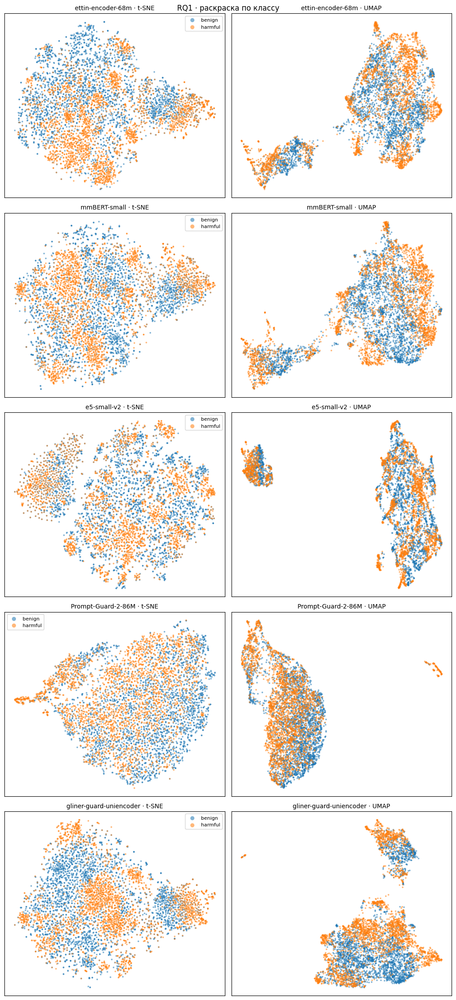

In [ ]:
plot_projections(RQ1_PROJECTIONS, RQ1_LABELS, "RQ1 · раскраска по классу")

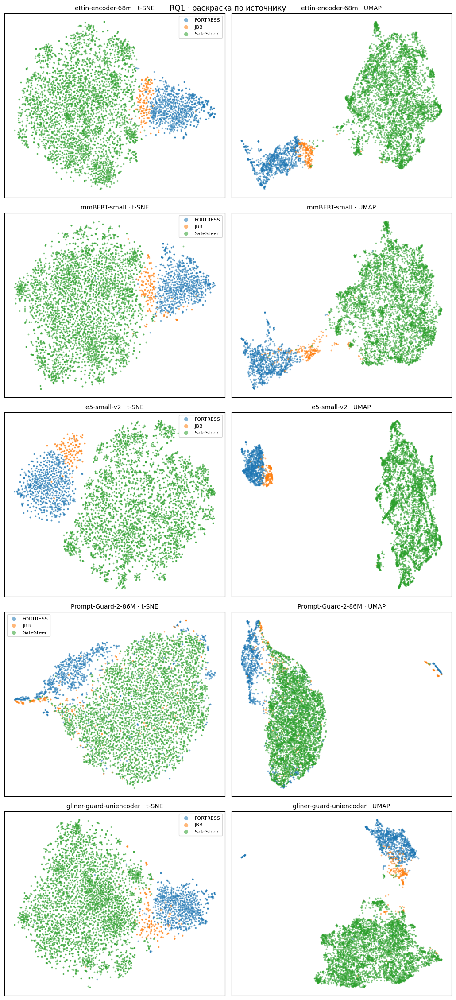

In [ ]:
plot_projections(RQ1_PROJECTIONS, RQ1_SOURCES, "RQ1 · раскраска по источнику")

**Комментарий**:

Визуально внутри каждого источника можно проследить разделение между safe/harm для моделей. Хуже всех в случае e5-small, лучше у моделей обученных под safety.

На датасете fortress все модели даже показывают некую линейную разделимость.

## RQ1: кластеризация

KMeans в четырёх режимах препроцессинга и HDBSCAN в двух — тех, где перед ним стоит PCA. В полной
размерности HDBSCAN на этих данных уводит в шум почти всё.

Колонка `components` показывает, сколько направлений реально осталось: при `pca-90` число своё
у каждой модели.

In [ ]:
RQ1_CLUSTERS, rq1_cluster_table = run_clustering(
    RQ1_EMBEDDINGS, RQ1_LABELS, RQ1_SOURCES, "source"
)
display(style_table(rq1_cluster_table, "RQ1 · кластеризация против двух разметок"))

for (name, method, mode), labels in RQ1_CLUSTERS.items():
    if mode != "pca-90":
        continue
    print(f"{name} · {method} · {mode}")
    display(pd.crosstab(pd.Series(RQ1_LABELS, name="класс"), pd.Series(labels, name="кластер")))
    display(pd.crosstab(pd.Series(RQ1_SOURCES, name="источник"), pd.Series(labels, name="кластер")))

ettin-encoder-68m · kmeans · pca-90


кластер,0,1
класс,,
benign,510,2388
harmful,750,2148


кластер,0,1
источник,,
FORTRESS,946,50
JBB,101,99
SafeSteer,213,4387


ettin-encoder-68m · hdbscan · pca-90


кластер,-1
класс,
benign,2898
harmful,2898


кластер,-1
источник,
FORTRESS,996
JBB,200
SafeSteer,4600


mmBERT-small · kmeans · pca-90


кластер,0,1
класс,,
benign,419,2479
harmful,565,2333


кластер,0,1
источник,,
FORTRESS,851,145
JBB,30,170
SafeSteer,103,4497


mmBERT-small · hdbscan · pca-90


кластер,-1,0,1
класс,,,
benign,2549,293,56
harmful,2339,482,77


кластер,-1,0,1
источник,,,
FORTRESS,272,718,6
JBB,191,1,8
SafeSteer,4425,56,119


e5-small-v2 · kmeans · pca-90


кластер,0,1
класс,,
benign,2287,611
harmful,2277,621


кластер,0,1
источник,,
FORTRESS,0,996
JBB,0,200
SafeSteer,4564,36


e5-small-v2 · hdbscan · pca-90


кластер,-1,0,1,2,3
класс,,,,,
benign,2511,1,242,137,7
harmful,2090,78,351,356,23


кластер,-1,0,1,2,3
источник,,,,,
FORTRESS,497,0,499,0,0
JBB,106,0,94,0,0
SafeSteer,3998,79,0,493,30


Prompt-Guard-2-86M · kmeans · pca-90


кластер,0,1
класс,,
benign,1901,997
harmful,1412,1486


кластер,0,1
источник,,
FORTRESS,243,753
JBB,49,151
SafeSteer,3021,1579


Prompt-Guard-2-86M · hdbscan · pca-90


кластер,-1,0,1
класс,,,
benign,2028,630,240
harmful,1914,384,600


кластер,-1,0,1
источник,,,
FORTRESS,409,60,527
JBB,95,9,96
SafeSteer,3438,945,217


gliner-guard-uniencoder · kmeans · pca-90


кластер,0,1
класс,,
benign,1731,1167
harmful,1248,1650


кластер,0,1
источник,,
FORTRESS,202,794
JBB,42,158
SafeSteer,2735,1865


gliner-guard-uniencoder · hdbscan · pca-90


кластер,-1,0,1
класс,,,
benign,2674,224,0
harmful,2440,433,25


кластер,-1,0,1
источник,,,
FORTRESS,346,650,0
JBB,200,0,0
SafeSteer,4568,7,25


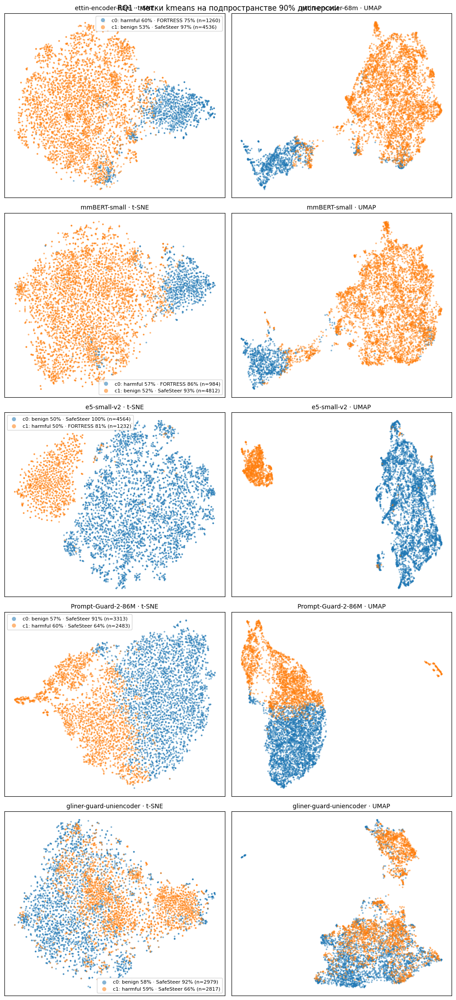

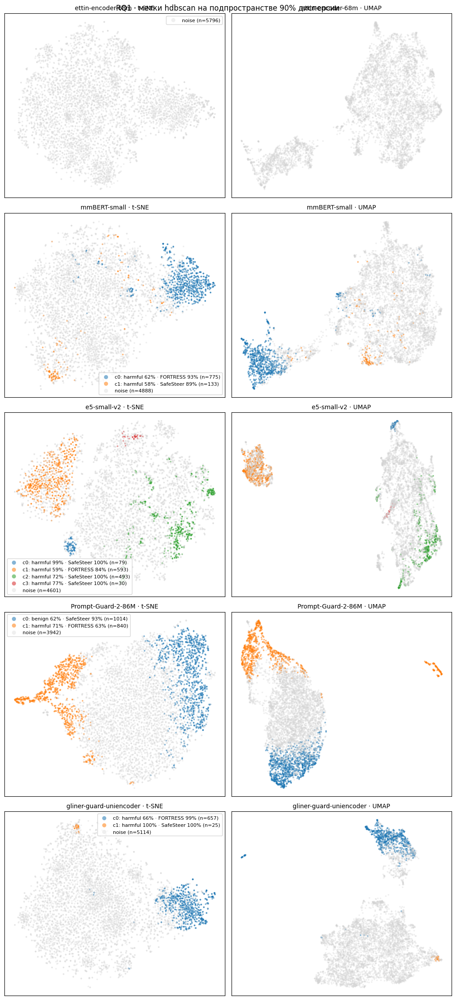

In [ ]:
for method in ("kmeans", "hdbscan"):
    display(plot_projections(
        RQ1_PROJECTIONS,
        {
            name: describe_clusters(RQ1_CLUSTERS[(name, method, "pca-90")], RQ1_LABELS, RQ1_SOURCES)
            for name in RQ1_EMBEDDINGS
        },
        f"RQ1 · метки {method} на подпространстве 90% дисперсии",
    ))

## Выводы по смешанной выборке

**Классы визуально не разделяются.** На обеих проекциях benign и harmful перемешаны у всех
моделей: локально попадаются области с перевесом одного класса, но сплошных облаков нет.

**Зато виден источник.** При раскраске по SafeSteer / FORTRESS / JBB структура проявляется
заметно отчётливее, и `ARI source` в таблице выше `ARI class`. Тексты трёх наборов различаются
лексикой, форматом и длиной, и эти различия занимают ведущие направления разброса.

**Обрезка по 90% дисперсии сама по себе картину не меняет.** PCA отбирает направления по величине
дисперсии, то есть сохраняет как раз мешающие оси, а выбрасывает слабый хвост. Сравнение строк
`kmeans · raw` и `kmeans · pca-90` показывает, сколько в этом хвосте было шума; сравнение с
`all-but-top-1` — сколько структуры держалось на одной доминирующей оси.

Отрицательный результат по классу здесь не значит «информации о вредоносности нет». Он значит,
что вредоносность не является доминирующим направлением разброса: линейный пробник вна тех же данных даёт AUROC около 0.95, при том что разделяющее направление занимает доли процента дисперсии.

# WildGuardMix: один источник, два стиля

Провенанс здесь постоянен по построению, зато есть контролируемый второй фактор — форма подачи
промпта: прямой запрос против джейлбрейк-формулировки.

In [ ]:
WG_PROJECTIONS = get_projections(WG_EMBEDDINGS)

/usr/local/lib/python3.13/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


ettin-encoder-68m: готово


/usr/local/lib/python3.13/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


mmBERT-small: готово


/usr/local/lib/python3.13/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


e5-small-v2: готово


/usr/local/lib/python3.13/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Prompt-Guard-2-86M: готово


/usr/local/lib/python3.13/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


gliner-guard-uniencoder: готово


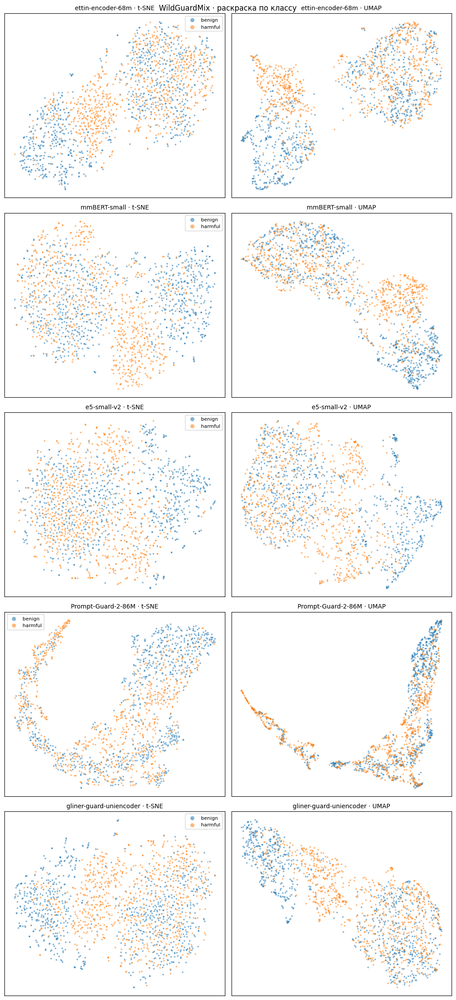

In [ ]:
plot_projections(WG_PROJECTIONS, WG_LABELS, "WildGuardMix · раскраска по классу")

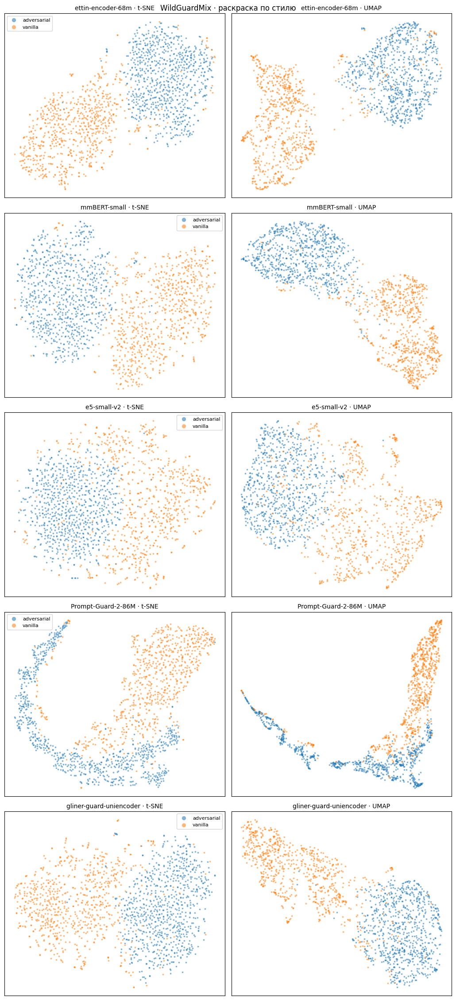

In [ ]:
plot_projections(WG_PROJECTIONS, WG_STYLES, "WildGuardMix · раскраска по стилю")

**Комментарий**

Модели достаточно хорошо разделяют vanilla, но adversarial эмбеддинги сильно перемешаны.

## WildGuardMix: кластеризация

In [ ]:
WG_CLUSTERS, wg_cluster_table = run_clustering(
    WG_EMBEDDINGS, WG_LABELS, WG_STYLES, "style"
)
display(style_table(wg_cluster_table, "WildGuardMix · кластеризация против двух разметок"))

for (name, method, mode), labels in WG_CLUSTERS.items():
    if mode != "pca-90":
        continue
    print(f"{name} · {method} · {mode}")
    display(pd.crosstab(pd.Series(WG_LABELS, name="класс"), pd.Series(labels, name="кластер")))
    display(pd.crosstab(pd.Series(WG_STYLES, name="стиль"), pd.Series(labels, name="кластер")))

ettin-encoder-68m · kmeans · pca-90


кластер,0,1
класс,,
benign,409,391
harmful,427,373


кластер,0,1
стиль,,
adversarial,790,10
vanilla,46,754


ettin-encoder-68m · hdbscan · pca-90


кластер,-1,0,1
класс,,,
benign,661,36,103
harmful,713,60,27


кластер,-1,0,1
стиль,,,
adversarial,705,95,0
vanilla,669,1,130


mmBERT-small · kmeans · pca-90


кластер,0,1
класс,,
benign,392,408
harmful,425,375


кластер,0,1
стиль,,
adversarial,780,20
vanilla,37,763


mmBERT-small · hdbscan · pca-90


кластер,-1,0,1
класс,,,
benign,332,166,302
harmful,439,28,333


кластер,-1,0,1
стиль,,,
adversarial,169,0,631
vanilla,602,194,4


e5-small-v2 · kmeans · pca-90


кластер,0,1
класс,,
benign,385,415
harmful,418,382


кластер,0,1
стиль,,
adversarial,767,33
vanilla,36,764


e5-small-v2 · hdbscan · pca-90


кластер,-1,0,1
класс,,,
benign,732,47,21
harmful,716,9,75


кластер,-1,0,1
стиль,,,
adversarial,702,3,95
vanilla,746,53,1


Prompt-Guard-2-86M · kmeans · pca-90


кластер,0,1
класс,,
benign,615,185
harmful,494,306


кластер,0,1
стиль,,
adversarial,386,414
vanilla,723,77


Prompt-Guard-2-86M · hdbscan · pca-90


кластер,-1,0,1
класс,,,
benign,124,557,119
harmful,153,419,228


кластер,-1,0,1
стиль,,,
adversarial,98,396,306
vanilla,179,580,41


gliner-guard-uniencoder · kmeans · pca-90


кластер,0,1
класс,,
benign,403,397
harmful,454,346


кластер,0,1
стиль,,
adversarial,786,14
vanilla,71,729


gliner-guard-uniencoder · hdbscan · pca-90


кластер,-1,0,1
класс,,,
benign,247,199,354
harmful,359,71,370


кластер,-1,0,1
стиль,,,
adversarial,87,0,713
vanilla,519,270,11


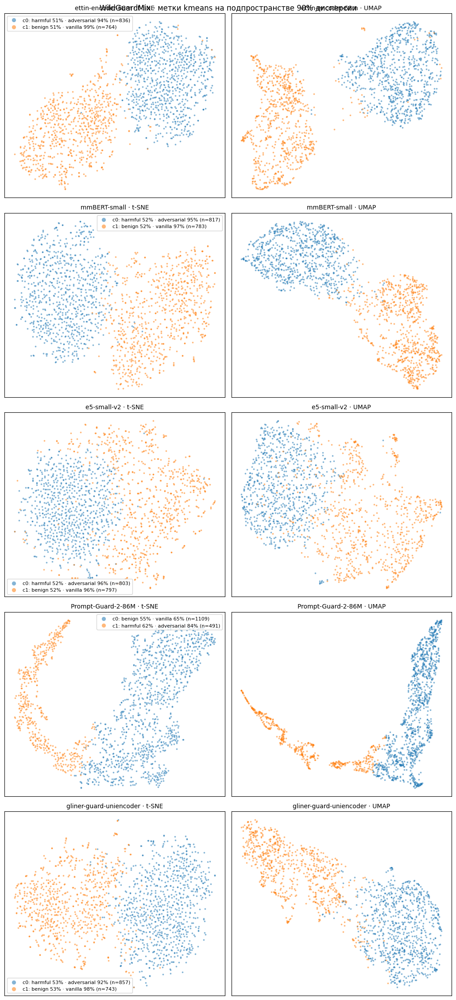

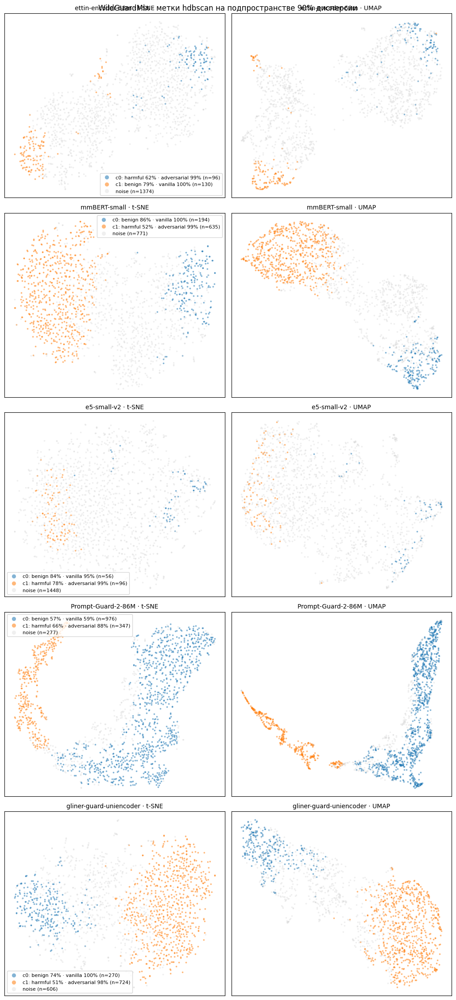

In [ ]:
for method in ("kmeans", "hdbscan"):
    display(plot_projections(
        WG_PROJECTIONS,
        {
            name: describe_clusters(WG_CLUSTERS[(name, method, "pca-90")], WG_LABELS, WG_STYLES)
            for name in WG_EMBEDDINGS
        },
        f"WildGuardMix · метки {method} на подпространстве 90% дисперсии",
    ))

## KMeans после снятия доминирующей компоненты

Кластеры и картинка считаются в одном пространстве — после центрирования и удаления первой
главной компоненты. Это важно: если нанести метки из очищенного пространства на проекцию, где
доминирующая ось ещё на месте, кластеры будут выглядеть перемешанными просто из-за несовпадения
пространств, а не из-за свойств разбиения.

Сравнивать эту картинку нужно с раскраской по классу и по второму фактору выше: если после
снятия первой компоненты кластеры перестали повторять источник или стиль, значит вся поверхностная
структура держалась на одном направлении.

/usr/local/lib/python3.13/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


ettin-encoder-68m: готово


/usr/local/lib/python3.13/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


mmBERT-small: готово


/usr/local/lib/python3.13/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


e5-small-v2: готово


/usr/local/lib/python3.13/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Prompt-Guard-2-86M: готово


/usr/local/lib/python3.13/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


gliner-guard-uniencoder: готово


/usr/local/lib/python3.13/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


ettin-encoder-68m: готово


/usr/local/lib/python3.13/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


mmBERT-small: готово


/usr/local/lib/python3.13/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


e5-small-v2: готово


/usr/local/lib/python3.13/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Prompt-Guard-2-86M: готово


/usr/local/lib/python3.13/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


gliner-guard-uniencoder: готово


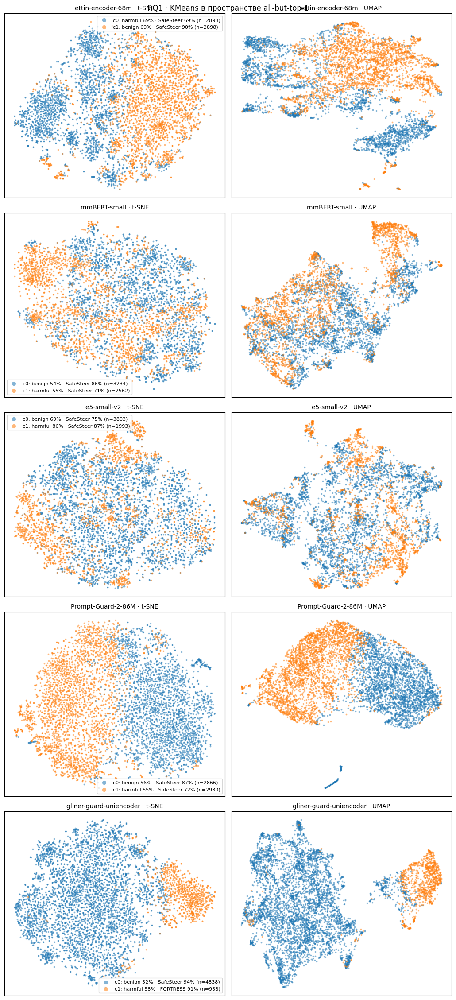

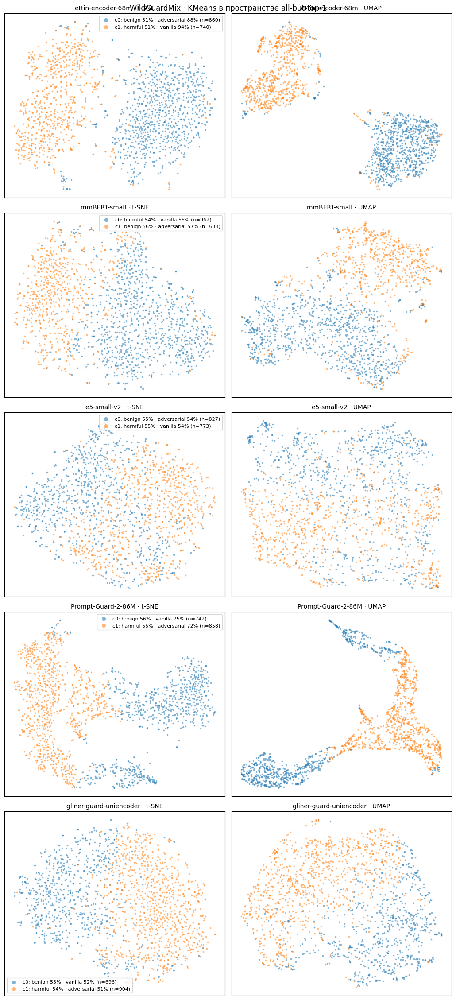

In [ ]:
CLEAN_MODE = "all-but-top-1"

# Проекции строятся в том же пространстве, в котором считались кластеры: иначе метки из
# очищенного пространства наносились бы на картинку, где доминирующая ось ещё на месте.
CLEAN_PROJECTIONS = {
    "RQ1": get_projections(RQ1_EMBEDDINGS, CLEAN_MODE),
    "WildGuardMix": get_projections(WG_EMBEDDINGS, CLEAN_MODE),
}

CLEAN_SETUP = {
    "RQ1": (RQ1_EMBEDDINGS, RQ1_CLUSTERS, RQ1_LABELS, RQ1_SOURCES),
    "WildGuardMix": (WG_EMBEDDINGS, WG_CLUSTERS, WG_LABELS, WG_STYLES),
}

for dataset_name, (embeddings, clusters, class_labels, factor_labels) in CLEAN_SETUP.items():
    display(plot_projections(
        CLEAN_PROJECTIONS[dataset_name],
        {
            name: describe_clusters(
                clusters[(name, "kmeans", CLEAN_MODE)], class_labels, factor_labels
            )
            for name in embeddings
        },
        f"{dataset_name} · KMeans в пространстве {CLEAN_MODE}",
    ))